<font color='red'>AIM OF THIS ANALYSIS IS TO UNDERSTAND WHICH PROVINCES IN ITALY ARE SHOWING HIGHER NUMBER OF CAR ACCIDENTS AND UNDERSTAND WHICH STREETS SHOULD BE REVIEWED IN TERMS OF INFRASTRUCTURE IN ORDER TO REDUCE NUMBER OF ACCIDENTS AND DEADS</font>
***

<font color='blue'>PRELIMINARY ACTIVITIES AND DATA AGGREGATION</font>
***

In [1]:
# Explore available jupyter themes
#!jt -l

In [2]:
# Change jupyter theme
#!jt -t monokai

In [3]:
# Restart settings to original theme
!jt -r

Reset css and font defaults in:
C:\Users\GABRIELE\.jupyter\custom &
C:\Users\GABRIELE\AppData\Roaming\jupyter\nbextensions


In [4]:
# Importing libraries
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
%matplotlib inline
import pandas_log
import dtale

In [5]:
# Importing input files (one file for each year from 2010 to 2020)
incidenti_2010 = pd.read_excel('Dati_per_strada_provinciale_2010.xlsx')
incidenti_2011 = pd.read_excel('Dati_per_strada_provinciale_2011.xlsx')
incidenti_2012 = pd.read_excel('Dati_per_strada_provinciale_2012.xlsx')
incidenti_2013 = pd.read_excel('Dati_per_strada_provinciale_2013.xlsx')
incidenti_2014 = pd.read_excel('Dati_per_strada_provinciale_2014.xlsx')
incidenti_2015 = pd.read_excel('Dati_per_strada_provinciale_2015.xlsx')
incidenti_2016 = pd.read_excel('Dati_per_strada_provinciale_2016.xlsx')
incidenti_2017 = pd.read_excel('Dati_per_strada_provinciale_2017.xlsx')
incidenti_2018 = pd.read_excel('Dati_per_strada_provinciale_2018.xlsx')
incidenti_2019 = pd.read_excel('Dati_per_strada_provinciale_2019.xlsx')
incidenti_2020 = pd.read_excel('Dati_per_strada_provinciale_2020.xlsx')

In [6]:
# Verifying consistency across different input files

# Creating a list including all datasets
dataframes = [incidenti_2010,
              incidenti_2011,
              incidenti_2012,
              incidenti_2013,
              incidenti_2014,
              incidenti_2015,
              incidenti_2016,
              incidenti_2017,
              incidenti_2018,
              incidenti_2019,
              incidenti_2020]

# Verifying dataframes have same columns
if all([set(dataframes[0].columns) == set(df.columns) for df in dataframes]):
    print('All datasets have the same columns')
else:
    print('Some datasets have different columns')

Some datasets have different columns


In [7]:
# Computing number of columns for each dataframe
for i in dataframes:
    print (i.shape)
    
# Dataframe n.4 has 12 columns while all other dataframes only 11

(14395, 11)
(14743, 11)
(14833, 11)
(14977, 12)
(15034, 11)
(14980, 11)
(14988, 11)
(14960, 11)
(15005, 11)
(15059, 11)
(15097, 11)


In [8]:
# Verifyng columns names across different dataframes
for i in dataframes:
    print (i.columns)

Index(['01', '001', 'Torino', 'NOME STRADA', 'ESTESA', 'INC', 'MOR', 'FER',
       'Tasso di mortalità', 'Infortunati x Incidente', 'INDICE di GRAVITA''],
      dtype='object')
Index(['Cod Reg', 'Cod Prov', 'PROVINCIA', 'NOME STRADA', 'ESTESA', 'INC',
       'MOR', 'FER', 'Tasso di mortalità', 'Infortunati x Incidente',
       'INDICE di GRAVITA''],
      dtype='object')
Index(['Cod Reg', 'Cod Prov', 'PROVINCIA', 'NOME STRADA', 'ESTESA', 'INC',
       'MOR', 'FER', 'Tasso di mortalità', 'Infortunati x Incidente',
       'INDICE di GRAVITA''],
      dtype='object')
Index(['Cod Reg', 'Cod Prov', 'PROVINCIA', 'CODICE App', 'NOME STRADA',
       'ESTESA', 'INC', 'MOR', 'FER', 'Tasso di mortalità',
       'Infortunati x Incidente', 'INDICE di GRAVITA''],
      dtype='object')
Index(['Cod Reg', 'Cod Prov', 'PROVINCIA', 'NOME STRADA', 'ESTESA', 'INC',
       'MOR', 'FER', 'Tasso di mortalità', 'Infortunati x Incidente',
       'INDICE di GRAVITA''],
      dtype='object')
Index(['Cod Reg', 'Co

In [9]:
# Removing field 'CODICE App' within dataframe  n.4
incidenti_2013.drop('CODICE App', axis=1, inplace=True)

# Renaming fields of dataframe n.1
incidenti_2010.rename(columns = 
                      {'01':'Cod Reg',
                      '001':'Cod Prov',
                      'Torino':'PROVINCIA'},
                      inplace = True)

# Renaming fields of dataframe n.8
incidenti_2017.rename(columns = 
                      {'Tasso di mortalità (M per 1000 Inc)':'Tasso di mortalità',
                      "INDICE di GRAVITA' (M/(M+F))":"INDICE di GRAVITA'"},
                      inplace = True)

# Renaming fields of dataframe n.9
incidenti_2018.rename(columns = 
                      {'Indice di mortalità':'Tasso di mortalità'},
                      inplace = True)

# Renaming fields of dataframe n.10
incidenti_2019.rename(columns = 
                      {'Incidenti':'INC',
                      'Morti':'MOR',
                      'Feriti':'FER',
                      'Indice di gravità':"INDICE di GRAVITA'",
                      'Indice di mortalità':'Tasso di mortalità'},
                      inplace = True)

# Renaming fields of dataframe n.11
incidenti_2020.rename(columns = 
                      {'Incidenti':'INC',
                      'Morti':'MOR',
                      'Feriti':'FER',
                      'Indice di gravità':"INDICE di GRAVITA'",
                      'Indice di mortalità':'Tasso di mortalità'},
                      inplace = True)

In [10]:
# Let's add a column for each dataframe to keep track of year
incidenti_2010['Anno']=2010
incidenti_2011['Anno']=2011
incidenti_2012['Anno']=2012
incidenti_2013['Anno']=2013
incidenti_2014['Anno']=2014
incidenti_2015['Anno']=2015
incidenti_2016['Anno']=2016
incidenti_2017['Anno']=2017
incidenti_2018['Anno']=2018
incidenti_2019['Anno']=2019
incidenti_2020['Anno']=2020

In [11]:
# Updating list including all dataframes
dataframes = [incidenti_2010,
              incidenti_2011,
              incidenti_2012,
              incidenti_2013,
              incidenti_2014,
              incidenti_2015,
              incidenti_2016,
              incidenti_2017,
              incidenti_2018,
              incidenti_2019,
              incidenti_2020]

In [12]:
# Verifyng all dataframes share same columns
if all([set(dataframes[0].columns) == set(df.columns) for df in dataframes]):
    print('All datasets have the same columns')
else:
    print('Some datasets have different columns')

All datasets have the same columns


In [13]:
# Now it's time to append all different dataframes in order to create an aggregated one
Dataset_incidenti = pd.concat([incidenti_2010,
           incidenti_2011,
           incidenti_2012,
           incidenti_2013,
           incidenti_2014,
           incidenti_2015,
           incidenti_2016,
           incidenti_2017,
           incidenti_2018,
           incidenti_2019,
           incidenti_2020])

In [14]:
# Deleting no more useful objects
del incidenti_2010
del incidenti_2011
del incidenti_2012
del incidenti_2013
del incidenti_2014
del incidenti_2015
del incidenti_2016
del incidenti_2017
del incidenti_2018
del incidenti_2019
del incidenti_2020
del dataframes

<font color='blue'>DATA CLEANSING ON AGGREGATED DATA</font>
***


In [15]:
# Let's display dimensions of aggregated dataset
Dataset_incidenti.shape
# we are working with 164k rows and 11 fields

(164071, 12)

In [16]:
# Let's display data types
Dataset_incidenti.info()
# Several data types are not right. It's necessary to modify them

<class 'pandas.core.frame.DataFrame'>
Int64Index: 164071 entries, 0 to 15096
Data columns (total 12 columns):
 #   Column                   Non-Null Count   Dtype 
---  ------                   --------------   ----- 
 0   Cod Reg                  164071 non-null  int64 
 1   Cod Prov                 164071 non-null  int64 
 2   PROVINCIA                164071 non-null  object
 3   NOME STRADA              164071 non-null  object
 4   ESTESA                   164065 non-null  object
 5   INC                      164064 non-null  object
 6   MOR                      164064 non-null  object
 7   FER                      164064 non-null  object
 8   Tasso di mortalità       164020 non-null  object
 9   Infortunati x Incidente  164020 non-null  object
 10  INDICE di GRAVITA'       164020 non-null  object
 11  Anno                     164071 non-null  int64 
dtypes: int64(3), object(9)
memory usage: 16.3+ MB


In [17]:
# The issue is that there are some subtotal rows within input data
print(Dataset_incidenti[Dataset_incidenti['NOME STRADA']=='NOME STRADA'])

       Cod Reg  Cod Prov              PROVINCIA  NOME STRADA  ESTESA  INC  \
273          1         2               Vercelli  NOME STRADA  ESTESA  INC   
400          1         3                 Novara  NOME STRADA  ESTESA  INC   
524          1         4                  Cuneo  NOME STRADA  ESTESA  INC   
827          1         5                   Asti  NOME STRADA  ESTESA  INC   
1044         1         6            Alessandria  NOME STRADA  ESTESA  INC   
...        ...       ...                    ...          ...     ...  ...   
14527        1       103   Verbano-Cusio-Ossola  NOME STRADA  ESTESA  INC   
14621        3       108  Monza e della Brianza  NOME STRADA  ESTESA  INC   
14687       11       109                  Fermo  NOME STRADA  ESTESA  INC   
14826       16       110  Barletta-Andria-Trani  NOME STRADA  ESTESA  INC   
14879       20       111           Sud Sardegna  NOME STRADA  ESTESA  INC   

       MOR  FER   Tasso di mortalità  Infortunati x Incidente  \
273    MOR

In [18]:
# Let's remove all these useless rows
Dataset_incidenti = Dataset_incidenti[-Dataset_incidenti['NOME STRADA'].isin(['NOME STRADA',
                                      'Totale',
                                      'Totale localizzati',
                                      'Strada imprecisata o mal classificata',
                                    'Totali localizzati',
                                    'Nome strada'])]

In [19]:
# Let's check how dimensions have changed
Dataset_incidenti.shape
# So from 164.071 we do now have only 159.506 rows

(159292, 12)

In [20]:
# Data quality is not very good. There are also cases where cell is filled with "-" instead of blank
Dataset_incidenti[Dataset_incidenti['FER']=='-'].head(1)
# We need to convert all these '-' with NaN

,Cod Reg,Cod Prov,PROVINCIA,NOME STRADA,ESTESA,INC,MOR,FER,Tasso di mortalità,Infortunati x Incidente,INDICE di GRAVITA',Anno
14,1,1,Torino,SP 015 - di Ceretta Superiore,3.938,-,-,-,-,-,-,2010


In [21]:
# Converting all '-' with NaN
Dataset_incidenti.replace('-', np.NaN, inplace=True)

In [22]:
# Let's check if it is ok now
Dataset_incidenti[Dataset_incidenti['FER']=='-']
# It seems good

,Cod Reg,Cod Prov,PROVINCIA,NOME STRADA,ESTESA,INC,MOR,FER,Tasso di mortalità,Infortunati x Incidente,INDICE di GRAVITA',Anno


In [23]:
# For ease of use, let's convert blank space in column names with more friendly '_'
Dataset_incidenti.columns = Dataset_incidenti.columns.str.replace(' ','_')

In [24]:
# Let's check new column names
Dataset_incidenti.columns
# It seems far better now

Index(['Cod_Reg', 'Cod_Prov', 'PROVINCIA', 'NOME_STRADA', 'ESTESA', 'INC',
       'MOR', 'FER', 'Tasso_di_mortalità', 'Infortunati_x_Incidente',
       'INDICE_di_GRAVITA'', 'Anno'],
      dtype='object')

In [25]:
# Now Python is automatically recognizing right data types
Dataset_incidenti.info()
# We still want first two fields to be considered categorical and to remove field 'ESTESA' because we are not sure what it means

<class 'pandas.core.frame.DataFrame'>
Int64Index: 159292 entries, 0 to 15093
Data columns (total 12 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Cod_Reg                  159292 non-null  int64  
 1   Cod_Prov                 159292 non-null  int64  
 2   PROVINCIA                159292 non-null  object 
 3   NOME_STRADA              159292 non-null  object 
 4   ESTESA                   159291 non-null  object 
 5   INC                      76220 non-null   float64
 6   MOR                      76220 non-null   float64
 7   FER                      76220 non-null   float64
 8   Tasso_di_mortalità       76220 non-null   float64
 9   Infortunati_x_Incidente  76220 non-null   float64
 10  INDICE_di_GRAVITA'       76220 non-null   float64
 11  Anno                     159292 non-null  int64  
dtypes: float64(6), int64(3), object(3)
memory usage: 15.8+ MB


In [26]:
# Dropping field'ESTESA'
Dataset_incidenti.drop('ESTESA', axis=1, inplace=True)

# Converting 'Cod_Reg' and 'Cod_Prov' to categorical
Dataset_incidenti["Cod_Reg"] = Dataset_incidenti["Cod_Reg"].astype("str")
Dataset_incidenti["Cod_Prov"] = Dataset_incidenti["Cod_Prov"].astype("str")

In [27]:
# Let's do a final check
Dataset_incidenti.info()
# We're ready for data exploration

<class 'pandas.core.frame.DataFrame'>
Int64Index: 159292 entries, 0 to 15093
Data columns (total 11 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Cod_Reg                  159292 non-null  object 
 1   Cod_Prov                 159292 non-null  object 
 2   PROVINCIA                159292 non-null  object 
 3   NOME_STRADA              159292 non-null  object 
 4   INC                      76220 non-null   float64
 5   MOR                      76220 non-null   float64
 6   FER                      76220 non-null   float64
 7   Tasso_di_mortalità       76220 non-null   float64
 8   Infortunati_x_Incidente  76220 non-null   float64
 9   INDICE_di_GRAVITA'       76220 non-null   float64
 10  Anno                     159292 non-null  int64  
dtypes: float64(6), int64(1), object(4)
memory usage: 14.6+ MB


In [28]:
# Let's explore missing data
Dataset_incidenti.isnull().sum()
# We do have 83.072 rows for which we do not have data
# It is likely that these are cases where no accident where recorded for that specific street in that year

Cod_Reg                        0
Cod_Prov                       0
PROVINCIA                      0
NOME_STRADA                    0
INC                        83072
MOR                        83072
FER                        83072
Tasso_di_mortalità         83072
Infortunati_x_Incidente    83072
INDICE_di_GRAVITA'         83072
Anno                           0
dtype: int64

In [29]:
# Let's remove all these rows
Dataset_incidenti.dropna(inplace=True)

In [30]:
# Now there are no NULL within dataset
Dataset_incidenti.isnull().sum()
# We're ready for data exploration

Cod_Reg                    0
Cod_Prov                   0
PROVINCIA                  0
NOME_STRADA                0
INC                        0
MOR                        0
FER                        0
Tasso_di_mortalità         0
Infortunati_x_Incidente    0
INDICE_di_GRAVITA'         0
Anno                       0
dtype: int64

<font color='blue'>DATA EXPLORATION ON TARGET DATASET</font>
***

findfont: Font family ['Heiti TC'] not found. Falling back to DejaVu Sans.


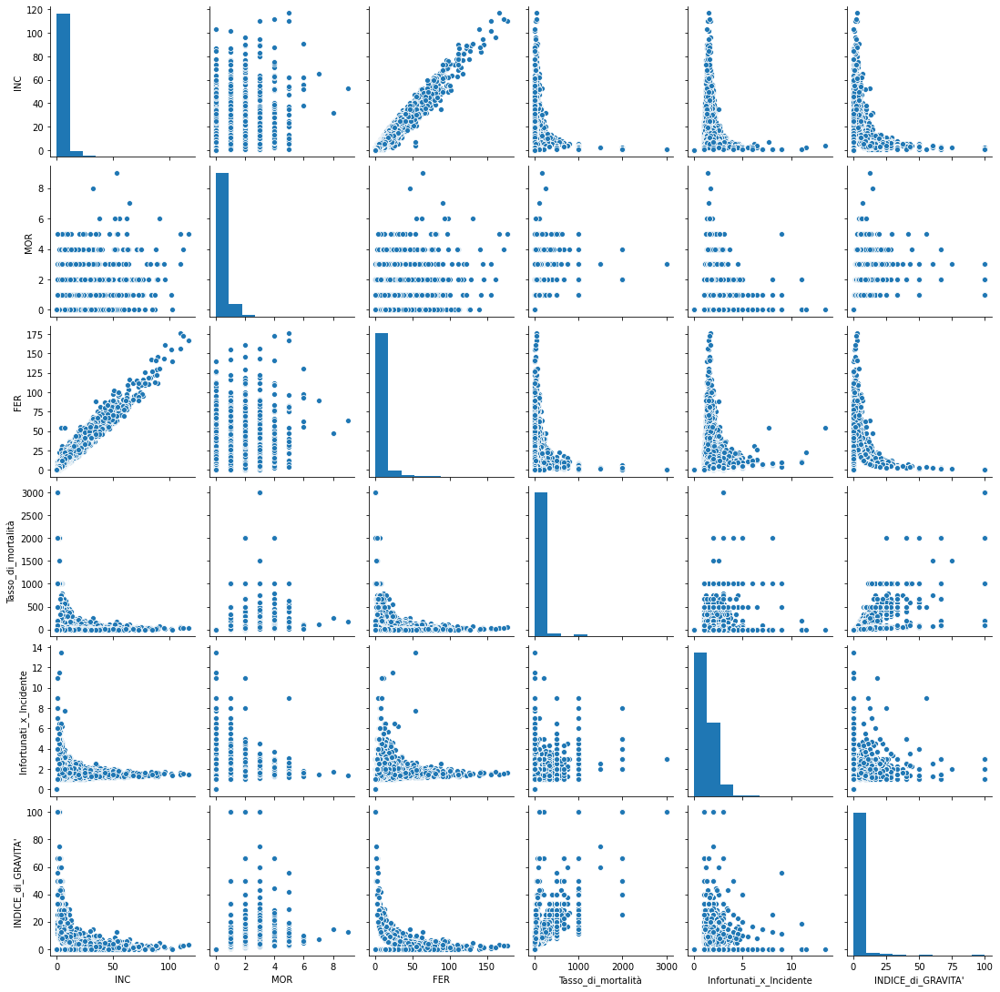

In [31]:
# Let's explore relationship between numerical features
%matplotlib inline
sns.pairplot(Dataset_incidenti[['INC',
                                'MOR',
                                'FER',
                                'Tasso_di_mortalità',
                                'Infortunati_x_Incidente',
                                "INDICE_di_GRAVITA'"]])

In [32]:
# Let's explore dataframe in excel style
#d = dtale.show(Dataset_incidenti)
#d.open_browser()

In [33]:
# Closing the instance
#d.kill()

In [34]:
# We detected that a province is mispelled while other provinces are no more/still active
Dataset_incidenti.PROVINCIA = Dataset_incidenti.PROVINCIA.str.replace('Pesaro-Urbino','Pesaro Urbino')

# We set the right province for those no more active or not still active
# 'Ogliastra' until 2016 then 'Nuoro'
# 'Olbia-Tempio' until 2016 then 'Sassari'
# 'Medio Campidano' until 2016 then 'Sud Sardegna'
# 'Carbonia-iglesias' until 2016 then 'Sud Sardegna'

Dataset_incidenti.PROVINCIA = Dataset_incidenti.PROVINCIA.str.replace('Ogliastra','Nuoro')
Dataset_incidenti.PROVINCIA = Dataset_incidenti.PROVINCIA.str.replace('Olbia-Tempio','Sassari')
Dataset_incidenti.PROVINCIA = Dataset_incidenti.PROVINCIA.str.replace('Medio Campidano','Sud Sardegna')
Dataset_incidenti.PROVINCIA = Dataset_incidenti.PROVINCIA.str.replace('Carbonia-Iglesias','Sud Sardegna')

In [35]:
# Now each road appears several times in our dataset (1 for each year)
# We need to aggregate at street level
Dataset_inc_grouped = Dataset_incidenti.groupby(['Cod_Reg',
                           'Cod_Prov',
                           'PROVINCIA',
                           'NOME_STRADA'], 
                          as_index=False).agg(Totale_incidenti=('INC','sum'), 
                                            Totale_morti= ('MOR','sum'),
                                            Totale_feriti=('FER','sum'),
                                            Tasso_medio_mortalità=('Tasso_di_mortalità','mean'),
                                            Infortunati_medi_Incidente=('Infortunati_x_Incidente','mean'),
                                            Indice_gravità=("INDICE_di_GRAVITA'",'mean'))

In [36]:
# We do now have a smaller dataset consisting of 16k entries where each street should compare only once
Dataset_inc_grouped.shape

(15934, 10)

In [37]:
# Let's check it out
n_duplicates = Dataset_inc_grouped['NOME_STRADA'].duplicated().sum()
print(f"There are {n_duplicates} duplicates")
# There are 209 duplicates. 
# In these cases street has changed province or it belongs to more than one province

There are 118 duplicates


<font color='blue'>ANALYSIS ON TOTAL ACCIDENTS BY PROVINCE</font>
***

In [38]:
# Let's look at number of accidents by Province
Dataset_inc_grouped.groupby(['PROVINCIA']).agg(Tot_incidenti_all=('Totale_incidenti',
                                                                  'sum')).sort_values(by='Tot_incidenti_all',
                                                                                     ascending=False)

# It seems reasonable that bigger cities do have the highest numbers of accidents
# That's why we need to take into account population

,Tot_incidenti_all
PROVINCIA,
Roma,9720.0
Torino,7676.0
Milano,7428.0
Treviso,6481.0
Padova,6304.0
...,...
Prato,358.0
Enna,323.0
Aosta,321.0


In [39]:
# Let's upload a file containing population for each province as tracked by ISTAT
pop_res = pd.read_excel('poplazione_residente_istat.xlsx')

In [40]:
# Let's join data about accidents with population data
Dataset_inc_pop = pd.merge(Dataset_inc_grouped,pop_res,how='left', left_on='PROVINCIA', right_on='Territorio')

In [41]:
# Verifying cardinality is the same after joining tables
#print(len(Dataset_inc_pop))
#print(len(Dataset_inc_grouped))

In [42]:
# Creation of dataset with province and accidents
Analysis_inc_pop = Dataset_inc_grouped.groupby(['PROVINCIA']).agg(Tot_incidenti_all=('Totale_incidenti',
                                                                  'sum')).sort_values(by='Tot_incidenti_all',
                                                                                     ascending=False)

# Porting of population data
Analysis_inc_pop = pd.merge(Analysis_inc_pop, pop_res, how='left', left_on='PROVINCIA', right_on='Territorio')

In [43]:
# Calculating ratio accidents/population
Analysis_inc_pop['ratio_inc_pop']=Analysis_inc_pop['Tot_incidenti_all']/Analysis_inc_pop['Popolazione']

# Let's multiply ration by 1.000 to calculate number of accidents per 1000 population
Analysis_inc_pop['ratio_inc_pop'] = Analysis_inc_pop['ratio_inc_pop']*1000


In [44]:
# Let's put "Territorio" as the first field of dataset just for ease of use
Analysis_inc_pop = Analysis_inc_pop[['Territorio', 'Tot_incidenti_all', 'Popolazione', 'ratio_inc_pop']]

In [45]:
# Let's sort values by inc_pop_ratio
Analysis_inc_pop.sort_values(by='ratio_inc_pop', ascending=False)

# Ok we can now see that Fermo, Grosseto and Pisa have the highest number of accidents when population is taken into account
# These cities do have about 10 car accidents per 1.000 population

,Territorio,Tot_incidenti_all,Popolazione,ratio_inc_pop
46,Fermo,1972.0,168485,11.704306
40,Grosseto,2175.0,216989,10.023550
20,Pisa,3403.0,417245,8.155880
26,Lucca,2875.0,381890,7.528346
35,Viterbo,2277.0,307592,7.402663
...,...,...,...,...
100,Agrigento,396.0,412427,0.960170
95,Reggio Calabria,486.0,518978,0.936456
77,Genova,742.0,816250,0.909035
31,Napoli,2351.0,2967117,0.792352


In [46]:
# Let's display this in a visual by importing proper libraries
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()
%matplotlib inline

In [47]:
# Let's display ratio population/accidents
import plotly.express as px
fig = px.box(Analysis_inc_pop,y="ratio_inc_pop",points='all', hover_name='Territorio')
fig.show()
# We can see the majority of provinces do have between 2 and 6 car accidents per 1.000 population
# Fermo and Grosseto seem to be extreme outliers

<font color='blue'>ANALYSIS TOTAL DEADS BY PROVINCE</font>
***

In [48]:
# Creation of dataset with provinces and deads due to car accidents
Analysis_dead_pop = Dataset_inc_grouped.groupby(['PROVINCIA']).agg(Tot_morti_all=('Totale_morti',
                                                                  'sum')).sort_values(by='Tot_morti_all',
                                                                                     ascending=False)

# Porting of population
Analysis_dead_pop = pd.merge(Analysis_dead_pop, pop_res, how='left', left_on='PROVINCIA', right_on='Territorio')

In [49]:
# Calculating ratio deads/population
Analysis_dead_pop['ratio_dead_pop']=Analysis_dead_pop['Tot_morti_all']/Analysis_dead_pop['Popolazione']

# Multiplying by 1000
Analysis_dead_pop['ratio_dead_pop']=Analysis_dead_pop['ratio_dead_pop']*1000


In [50]:
# Let's move column "Territorio" as the first one
Analysis_dead_pop = Analysis_dead_pop[['Territorio', 'Tot_morti_all', 'Popolazione', 'ratio_dead_pop']]

In [51]:
# Let's sort values by ratio deads/population
Analysis_dead_pop.sort_values(by='ratio_dead_pop', ascending=False)

# Ok we can now see that Vercelli, Grosseto and Ferrara have the highest number of deads when compared to population
# In Vercelli there are 0.44 deads due to car accidents per 1.000 population

,Territorio,Tot_morti_all,Popolazione,ratio_dead_pop
46,Vercelli,73.0,165760,0.440396
35,Grosseto,93.0,216989,0.428593
16,Ferrara,142.0,340755,0.416722
23,Viterbo,121.0,307592,0.393378
5,Cuneo,206.0,580789,0.354690
...,...,...,...,...
102,Trieste,8.0,230623,0.034689
89,Genova,25.0,816250,0.030628
81,Palermo,30.0,1199626,0.025008
106,Imperia,5.0,208561,0.023974


In [52]:
# Let's analyze ratio
fig = px.box(Analysis_dead_pop,y="ratio_dead_pop",points='all', hover_name='Territorio')
fig.show()
# We can see the majority of provinces do have between 0.1 and 0.2 deads per 1.000 population

<font color='blue'>ANALYSIS ON AVERAGE DEATH RATE BY PROVINCE</font>
***

In [53]:
# Creation of dataset with provinces and average dead rate
Analysis_deadrate_pop = Dataset_inc_grouped.groupby(['PROVINCIA']).agg(Tasso_mort_all=('Tasso_medio_mortalità',
                                                                  'mean')).sort_values(by='Tasso_mort_all',
                                                                                     ascending=False)

# Porting of population
Analysis_deadrate_pop = pd.merge(Analysis_deadrate_pop, pop_res, how='left', left_on='PROVINCIA', right_on='Territorio')

In [54]:
# Let's move column "Territorio" as the first one
Analysis_deadrate_pop = Analysis_deadrate_pop[['Territorio', 'Tasso_mort_all', 'Popolazione']]

In [55]:
# Let's sort values by ratio
Analysis_deadrate_pop.sort_values(by='Tasso_mort_all', ascending=False)

# Ok we can now see that Cagliari, Matera and Vercelli have highest dead rates
# Within these provinces, accidents are more dangerous

,Territorio,Tasso_mort_all,Popolazione
0,Cagliari,58.264487,419770
1,Matera,56.552679,191663
2,Vercelli,48.781807,165760
3,Sud Sardegna,44.740122,335108
4,Taranto,44.670293,558130
...,...,...,...
102,La Spezia,5.692959,214879
103,Gorizia,4.728152,138666
104,Imperia,4.186092,208561
105,Prato,2.397817,264397


In [56]:
# Let's analyze death rate
fig = px.box(Analysis_deadrate_pop,y="Tasso_mort_all",points='all', hover_name='Territorio')
fig.show()

<font color='blue'>ANALYSIS ON AVERAGE NUMBER OF INJURED PER ACCIDENT</font>
***

In [57]:
# Creation of dataset with provinces and injured per accident
Analysis_mean_inc_pop = Dataset_inc_grouped.groupby(['PROVINCIA']).agg(infort_medi_inc=('Infortunati_medi_Incidente',
                                                                  'mean')).sort_values(by='infort_medi_inc',
                                                                                     ascending=False)

# Porting of population
Analysis_mean_inc_pop = pd.merge(Analysis_mean_inc_pop, pop_res, how='left', left_on='PROVINCIA', right_on='Territorio')

In [58]:
# Let's move column "Territorio" as the first one
Analysis_mean_inc_pop = Analysis_mean_inc_pop[['Territorio', 'infort_medi_inc', 'Popolazione']]

In [59]:
# Let's sort values by ratio
Analysis_mean_inc_pop.sort_values(by='infort_medi_inc', ascending=False)

# Ok we can now see that Cagliari, Taranto and Brindisi have highest number of injured per incident

,Territorio,infort_medi_inc,Popolazione
0,Cagliari,1.491795,419770
1,Taranto,1.464459,558130
2,Brindisi,1.450805,379851
3,Bari,1.450731,1224756
4,Bologna,1.210327,1015701
...,...,...,...
102,Isernia,0.487198,80170
103,Rieti,0.487104,150689
104,Enna,0.477661,155982
105,Imperia,0.442876,208561


In [60]:
# Let's analyze injured per accident ratio
fig = px.box(Analysis_mean_inc_pop,y="infort_medi_inc",points='all', hover_name='Territorio')
fig.show()
# We can see the majority of provinces do have between 0.7 and 1.5 injured per accident
# Cagliari, Taranto, Brindisi and Bari seem to be outliers

<font color='blue'>ANALYSIS ON AVERAGE GRAVITY RATE BY PROVINCE</font>
***

In [61]:
# Creation of dataset with provinces and gravity
Analysis_tasso_grav_pop = Dataset_inc_grouped.groupby(['PROVINCIA']).agg(tasso_grav=('Indice_gravità',
                                                                  'mean')).sort_values(by='tasso_grav',
                                                                                     ascending=False)

# Porting of population
Analysis_tasso_grav_pop = pd.merge(Analysis_tasso_grav_pop, pop_res, how='left', left_on='PROVINCIA', right_on='Territorio')

In [62]:
# Let's move column "Territorio" as the first one
Analysis_tasso_grav_pop = Analysis_tasso_grav_pop[['Territorio', 'tasso_grav', 'Popolazione']]

In [63]:
# Let's sort values by ratio
Analysis_tasso_grav_pop.sort_values(by='tasso_grav', ascending=False)
# Ok we can now see that Cagliari, Sud Sardegna and Vercelli have highest ratios

,Territorio,tasso_grav,Popolazione
0,Cagliari,4.621291,419770
1,Sud Sardegna,4.566942,335108
2,Vercelli,4.348997,165760
3,Matera,3.733325,191663
4,Ferrara,3.708921,340755
...,...,...,...
102,Palermo,0.571645,1199626
103,Prato,0.418301,264397
104,Gorizia,0.410763,138666
105,Imperia,0.304454,208561


In [64]:
# Let's analyze index
fig = px.box(Analysis_tasso_grav_pop,y="tasso_grav",points='all', hover_name='Territorio')
fig.show()

<font color='blue'>AGGREGATED RESULTS</font>
***

In [65]:
# Creation of a table for each indicator
R1 = Analysis_inc_pop[['Territorio','ratio_inc_pop']].sort_values(by='ratio_inc_pop', ascending=False)
R2 = Analysis_dead_pop[['Territorio','ratio_dead_pop']].sort_values(by='ratio_dead_pop', ascending=False)
R3 = Analysis_deadrate_pop[['Territorio','Tasso_mort_all']].sort_values(by='Tasso_mort_all', ascending=False)
R4 = Analysis_mean_inc_pop[['Territorio','infort_medi_inc']].sort_values(by='infort_medi_inc', ascending=False)
R5 = Analysis_tasso_grav_pop[['Territorio','tasso_grav']].sort_values(by='tasso_grav', ascending=False)

In [66]:
# Aggregating results in a single table

from functools import reduce

Result_datasets = [R1, R2, R3, R4, R5]

Results = reduce(lambda  left,right: pd.merge(left,right,on=['Territorio'],
                                            how='outer'), Result_datasets).fillna('N/A')

In [67]:
# Displaying tabel in a nice format
import plotly.graph_objects as go

fig = go.Figure(data=[go.Table(
    header=dict(values=list(Results.columns),
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[Results.Territorio,
                       Results.ratio_inc_pop,
                       Results.ratio_dead_pop,
                       Results.Tasso_mort_all, 
                       Results.infort_medi_inc,
                       Results.tasso_grav],
               fill_color='lavender',
               align='left'))
])

fig.show()

In [68]:
# Now since indicators do have different units of measure we need to normalize them to make it comparable
from sklearn.preprocessing import StandardScaler

cols_to_norm = ['ratio_inc_pop','ratio_dead_pop','Tasso_mort_all','infort_medi_inc','tasso_grav']
Results[cols_to_norm] = StandardScaler().fit_transform(Results[cols_to_norm])

In [69]:
# Verfying normalized dataset
Results

,Territorio,ratio_inc_pop,ratio_dead_pop,Tasso_mort_all,infort_medi_inc,tasso_grav
0,Fermo,3.621505,1.235853,-1.171237,-0.457964,-1.372199
1,Grosseto,2.805275,2.790725,0.371802,0.079860,0.303213
2,Pisa,1.898273,0.513126,0.150708,1.014823,-0.083461
3,Lucca,1.593522,-0.118397,-0.415358,0.263621,0.004065
4,Viterbo,1.532486,2.409694,0.215505,0.344363,0.694549
...,...,...,...,...,...,...
102,Agrigento,-1.596200,-1.374485,-0.744688,-1.148747,-0.997594
103,Reggio Calabria,-1.607717,-1.262950,0.746733,0.088026,0.314640
104,Genova,-1.621033,-1.515323,0.220776,-0.806202,-0.065762
105,Napoli,-1.677698,-1.398178,-0.069365,-0.521989,0.193247


In [70]:
# Now that indicators are comparable let's calculate a synthetic score including all indicators
Results['syntetic_score']= Results[['ratio_inc_pop',
                                    'ratio_dead_pop',
                                    'Tasso_mort_all',
                                    'infort_medi_inc',
                                    'tasso_grav']].mean(axis=1)

In [71]:
# Let's display worst cities by sinthetic score
fig = px.bar(Results.sort_values(by='syntetic_score', 
                                 ascending=False ), 
             x='Territorio', 
             y='syntetic_score',
             color='syntetic_score')
fig.show()

# Provinces on the left side have numbers higher than national average while on the right provinces have lower numbers
# We can now see that Ferrara, Vercelli and Grosseto are the riskiest provinces while Messina, La spezia and Imperia the safest ones

<font color='blue'>ANALYSIS AT STREET LEVEL</font>
***

In [72]:
# Computing number of accidents by street
Analysis_st_inc_pop = Dataset_inc_grouped.groupby(['NOME_STRADA']).agg(Tot_incidenti_all=('Totale_incidenti',
                                                                  'sum')).sort_values(by='Tot_incidenti_all',
                                                                                     ascending=False)

Analysis_st_inc_pop.reset_index()

# SP 049/a - Prenestina-Poli (Polense) seems to be the worst street

,NOME_STRADA,Tot_incidenti_all
0,SP 049/a - Prenestina-Poli (Polense),1058.0
1,SP 042 - Jesolana,888.0
2,SP 022/a - Nomentana,654.0
3,SP 095/b - Laurentina (1° e 2° Tronco),645.0
4,SP 001 - Francigena,596.0
...,...,...
15811,SP 131 - Sesto San Giovanni-Nova Milanese,0.0
15812,SP 131 - Santa Caterina-Xirbi,0.0
15813,SP 131 - San Michele,0.0
15814,SP 040/b - Fontana Nuova-Moletta,0.0


In [73]:
# Let's display values 
fig = px.violin(Analysis_st_inc_pop.reset_index(),y="Tot_incidenti_all",points='all', hover_name='NOME_STRADA')
fig.show()
# We can see distribution is very skewed. Many streets did have very few accidents in last 5 years while few others a very high number

In [74]:
# Computing number of deads by street
Analysis_st_dead_pop = Dataset_inc_grouped.groupby(['NOME_STRADA']).agg(Tot_morti_all=('Totale_morti',
                                                                  'sum')).sort_values(by='Tot_morti_all',
                                                                                     ascending=False)

Analysis_st_dead_pop.reset_index()

# SP 001 - Circumvallazione Esterna di Napoli seems to be the worst street in terms of deaths

,NOME_STRADA,Tot_morti_all
0,SP 001 - Circumvallazione Esterna di Napoli,31.0
1,SP 175 - Fuorni-SP 312-SP 030-Laura-SP 276 (Torre di Paestum) (Tronchi a-b-c),28.0
2,SP 042 - Jesolana,28.0
3,SP 039 - Vecchia Aurelia,28.0
4,SP 095/b - Laurentina (1° e 2° Tronco),27.0
...,...,...
15811,SP 054 - Filogaso-San Nicola da Crissa,0.0
15812,SP 054 - Gravellona-Novara,0.0
15813,SP 054 - Gualdo-Penna San Giovanni,0.0
15814,SP 054 - Gudo Visconti-Gaggiano,0.0


In [75]:
# Let's display values 
fig = px.violin(Analysis_st_dead_pop.reset_index(),y="Tot_morti_all",points='all', hover_name='NOME_STRADA')
fig.show()
# We can see distribution is very skewed. Many streets did have very few deads in last 5 years while few others a very high number

In [76]:
# Computing death rate by street
Analysis_st_deadrate_pop = Dataset_inc_grouped.groupby(['NOME_STRADA']).agg(Tasso_mort_all=('Tasso_medio_mortalità',
                                                                  'mean')).sort_values(by='Tasso_mort_all',
                                                                                     ascending=False)

Analysis_st_deadrate_pop.reset_index()
# Some streets do have very high rates but often this is due to low number of car accidents
# SP 029 - Calliano-Quattordio for example only had 1 car accident in the last 5 years, even if very deadly

,NOME_STRADA,Tasso_mort_all
0,SP 029 - Calliano-Quattordio,2000.0
1,SP 029 - Saluggia-Confine provinciale,2000.0
2,"209 (4°, 5° e 6° Tronco)",2000.0
3,SP 041 - Gazzanica-Aviatico,2000.0
4,SP 105 - Morcone-Scalo Ferroviario,2000.0
...,...,...
15811,SP 054 - Filogaso-San Nicola da Crissa,0.0
15812,SP 054 - Gravellona-Novara,0.0
15813,SP 054 - Gualdo-Penna San Giovanni,0.0
15814,SP 054 - Gudo Visconti-Gaggiano,0.0


In [77]:
# Let's display values 
fig = px.violin(Analysis_st_deadrate_pop.reset_index(),y="Tasso_mort_all",points='all', hover_name='NOME_STRADA')
fig.show()
# Eevn in this case distribution is very skewed

In [78]:
# Computing injured per accident by street
Analysis_st_mean_inc_pop = Dataset_inc_grouped.groupby(['NOME_STRADA']).agg(infort_medi_inc=('Infortunati_medi_Incidente',
                                                                  'mean')).sort_values(by='infort_medi_inc',
                                                                                     ascending=False)

Analysis_st_mean_inc_pop.reset_index()

,NOME_STRADA,infort_medi_inc
0,SP 062 - ex-Nazionale,6.5
1,SP 025 - Grumento-Tramutola,6.0
2,SP 320 - da Galatina alla Soleto-Sogliano (Piani),5.0
3,SP 194 - da Sannicola alla Gallipoli-S. Maria,4.5
4,SP 151 - dalla Martano-Otranto (Innesto Cannole) alla Torre S. Andrea-Otranto,4.0
...,...,...
15811,SP 061 - Canossa,0.0
15812,SP 148 - San Giovanni di Apollosa I,0.0
15813,SP 148 - SP 041-SP 023,0.0
15814,SP 061 - Cerasito-Duronia,0.0


In [79]:
# Let's display values 
fig = px.violin(Analysis_st_mean_inc_pop.reset_index(),y="infort_medi_inc",points='all', hover_name='NOME_STRADA')
fig.show()
# Distribution is a bit strange in this case
# We do have many streets with nearly 0 accidents, good number of streets between 1 and 2 and then some outliers

In [80]:
# Computing gravity rate by street
Analysis_st_tasso_grav_pop = Dataset_inc_grouped.groupby(['NOME_STRADA']).agg(tasso_grav=('Indice_gravità',
                                                                  'mean')).sort_values(by='tasso_grav',
                                                                                     ascending=False)

Analysis_st_tasso_grav_pop.reset_index()

,NOME_STRADA,tasso_grav
0,SP 419 - di Roppolo,100.0
1,Val d'Agri,100.0
2,SP 063 - SP 057-Onore,100.0
3,SP 105 - Morcone-Scalo Ferroviario,100.0
4,"209 (4°, 5° e 6° Tronco)",100.0
...,...,...
15811,SP 054 - Filogaso-San Nicola da Crissa,0.0
15812,SP 054 - Gravellona-Novara,0.0
15813,SP 054 - Gualdo-Penna San Giovanni,0.0
15814,SP 054 - Gudo Visconti-Gaggiano,0.0


In [81]:
# Let's display values 
fig = px.violin(Analysis_st_tasso_grav_pop.reset_index(),y="tasso_grav",points='all', hover_name='NOME_STRADA')
fig.show()
# Even in this case distribution is skewed but outliers could be influenced by number of accidents

In [82]:
# Let's aggregate also indicators by street
R6 = Analysis_st_inc_pop.reset_index()[['NOME_STRADA','Tot_incidenti_all']].sort_values(by='Tot_incidenti_all', ascending=False)
R7 = Analysis_st_dead_pop.reset_index()[['NOME_STRADA','Tot_morti_all']].sort_values(by='Tot_morti_all', ascending=False)
R8 = Analysis_st_deadrate_pop.reset_index()[['NOME_STRADA','Tasso_mort_all']].sort_values(by='Tasso_mort_all', ascending=False)
R9 = Analysis_st_mean_inc_pop.reset_index()[['NOME_STRADA','infort_medi_inc']].sort_values(by='infort_medi_inc', ascending=False)
R10 = Analysis_st_tasso_grav_pop.reset_index()[['NOME_STRADA','tasso_grav']].sort_values(by='tasso_grav', ascending=False)

In [83]:
# Aggregating results in a single table

from functools import reduce

Result_st_datasets = [R6, R7, R8, R9, R10]

Results_st = reduce(lambda  left,right: pd.merge(left,right,on=['NOME_STRADA'],
                                            how='outer'), Result_st_datasets).fillna('N/A')

In [84]:
# Since numbers are a bit messed when number of accidents is very low, let's focus on streets with at least 5 accidents in last 5 years
Results_st = Results_st[Results_st['Tot_incidenti_all']>=5]

In [85]:
Results_st

,NOME_STRADA,Tot_incidenti_all,Tot_morti_all,Tasso_mort_all,infort_medi_inc,tasso_grav
0,SP 049/a - Prenestina-Poli (Polense),1058.0,18.0,15.461435,1.516917,1.007821
1,SP 042 - Jesolana,888.0,28.0,22.161141,1.533530,1.940514
2,SP 022/a - Nomentana,654.0,21.0,26.745985,1.456816,2.093931
3,SP 095/b - Laurentina (1° e 2° Tronco),645.0,27.0,16.430425,0.989111,1.623725
4,SP 001 - Francigena,596.0,13.0,17.593173,1.323088,1.650167
...,...,...,...,...,...,...
6389,SP 149 - Ponte Ancinale-Cardinale,5.0,0.0,0.000000,2.625000,0.000000
6390,SP 056 - Paderno-Spinadesco,5.0,1.0,166.666667,1.000000,16.666667
6391,SP 129 - Perarolo,5.0,0.0,0.000000,0.600000,0.000000
6392,SP 012/a - di Fiamene,5.0,0.0,0.000000,0.750000,0.000000


In [86]:
# Now since indicators do have different units of measure we need to normalize them to make it comparable
# We are going to normalize only ratios, not column with absolute values
cols_st_to_norm = ['Tasso_mort_all','infort_medi_inc','tasso_grav']
Results_st[cols_st_to_norm] = StandardScaler().fit_transform(Results_st[cols_st_to_norm])

In [87]:
# Now that indicators are comparable let's calculate a synthetic score including all indicators
Results_st['syntetic_score']= Results_st[['Tasso_mort_all',
                                    'infort_medi_inc',
                                    'tasso_grav']].mean(axis=1)

In [88]:
# Let's display worst cities by sinthetic score
fig = px.bar(Results_st.sort_values(by='syntetic_score', 
                                 ascending=False ), 
             x='NOME_STRADA', 
             y='syntetic_score',
             color='syntetic_score')
fig.show()

# We can now see that SP 060 is Sardinia the worst street in terms of synthetic score

In [89]:
# Let's display worst 10 cities by total number of car accidents
fig = px.bar(Results_st.head(10).sort_values(by='Tot_incidenti_all', 
                                 ascending=False ), 
             x='NOME_STRADA', 
             y='Tot_incidenti_all',
             color='Tot_incidenti_all')
fig.show()

# We can now see that SP 049/A near Rome is the worst street in terms of number of car accidents

In [90]:
# Let's display worst ten cities by number of deaths
fig = px.bar(Results_st.head(10).sort_values(by='Tot_morti_all', 
                                 ascending=False ), 
             x='NOME_STRADA', 
             y='Tot_morti_all',
             color='Tot_morti_all')
fig.show()

# We can now see that SP 001 of Naples is the worst street in terms of deaths